ГЕНЕРАТОР "ЖИЗНЕННОГО ЦИКЛА КЛИЕНТА"

с сгенерированным датасетом

учебная версия

1 вариант

End-to-end synthetic Customer Support Knowledge Graph + GraphRAG evaluation framework

Генерация:
клиенты
обращения
диалоги

NLP:
embeddings
semantic search
BERTopic

Graph:
knowledge graph
связи клиентов, тикетов, тем

GraphRAG:
retrieval через FAISS + граф

Export:
Neo4j-ready CSV

УСТАНОВКА ЗАВИСИМОСТЕЙ

In [ ]:
!pip install -q pandas networkx matplotlib sentence-transformers bertopic faiss-cpu scikit-learn

ИМПОРТ БИБЛИОТЕК

In [ ]:
import random
import uuid
from datetime import datetime, timedelta
from collections import Counter

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

from sentence_transformers import SentenceTransformer
from bertopic import BERTopic

import faiss

КОНФИГУРАЦИЯ ДАННЫХ

In [ ]:
NUM_CLIENTS = 50

PRODUCTS = [
    "Кредитная карта",
    "Дебетовая карта",
    "Потребительский кредит",
    "Инвестиционный счет",
    "Страхование"
]

EVENTS = [
    "introduction",
    "product_interest",
    "purchase",
    "support_question",
    "complaint",
    "followup",
    "repeat_purchase"
]

ШАБЛОНЫ ДИАЛОГОВ

In [ ]:
CLIENT_TEMPLATES = {
    "complaint": [
        "У меня проблема с продуктом.",
        "Я недоволен обслуживанием.",
        "Хочу оставить жалобу."
    ],
    "support_question": [
        "Как пользоваться продуктом?",
        "Где посмотреть детали?",
        "Нужна помощь."
    ],
    "product_interest": [
        "Расскажите про продукт {product}.",
        "Какие условия?"
    ],
    "purchase": [
        "Хочу оформить {product}.",
        "Готов купить."
    ],
    "introduction": [
        "Здравствуйте, хочу узнать о продуктах.",
        "Какие есть услуги?"
    ],
    "followup": [
        "Есть новости?",
        "Проверяю статус."
    ],
    "repeat_purchase": [
        "Хочу ещё продукт.",
        "Есть дополнительные предложения?"
    ]
}

AGENT_TEMPLATES = {
    k: [
        "Понял, уточняю информацию.",
        "Сейчас помогу вам.",
        "Спасибо за обращение."
    ] for k in EVENTS
}

ГЕНЕРАЦИЯ КЛИЕНТА

In [ ]:
def generate_client():
    return {
        "client_id": str(uuid.uuid4()),
        "product": random.choice(PRODUCTS)
    }

ГЕНЕРАЦИЯ ДИАЛОГА

In [ ]:
def generate_dialog(event, product):
    msgs = []
    turns = random.randint(3, 5)

    msgs.append(("client", random.choice(CLIENT_TEMPLATES[event]).format(product=product)))

    for _ in range(turns):
        msgs.append(("agent", random.choice(AGENT_TEMPLATES[event])))
        msgs.append(("client", random.choice(CLIENT_TEMPLATES[event]).format(product=product)))

    return msgs

ГЕНЕРАЦИЯ ДАТАСЕТА

In [ ]:
rows = []

for _ in range(NUM_CLIENTS):

    client = generate_client()

    start_date = datetime(2025, 1, 1)
    prev_ticket = None

    for i, event in enumerate(EVENTS, start=1):

        ticket_id = str(uuid.uuid4())
        start_date += timedelta(days=random.randint(5, 25))

        dialog = generate_dialog(event, client["product"])

        for j, (speaker, text) in enumerate(dialog):

            rows.append({
                "client_id": client["client_id"],
                "ticket_id": ticket_id,
                "previous_ticket_id": prev_ticket,
                "event_type": event,
                "event_order": i,
                "message_order": j,
                "speaker": speaker,
                "product": client["product"],
                "date": start_date,
                "text": text
            })

        prev_ticket = ticket_id

df = pd.DataFrame(rows)

df.head()

СОХРАНЕНИЕ

In [ ]:
df.to_csv("dialogs.csv", index=False)

ЭМБЕДДИНГИ

In [ ]:
model = SentenceTransformer("all-MiniLM-L6-v2")

texts = df["text"].tolist()
embeddings = model.encode(texts, show_progress_bar=True)

FAISS индекс

In [ ]:
dim = embeddings.shape[1]

index = faiss.IndexFlatL2(dim)
index.add(np.array(embeddings).astype("float32"))

СЕМАНТИЧЕСКИЙ ПОИСК

In [ ]:
def search(query, k=5):
    q = model.encode([query])
    D, I = index.search(np.array(q).astype("float32"), k)
    return df.iloc[I[0]][["ticket_id", "text"]]

BERTopic
ТЕМЫ

In [ ]:
topic_model = BERTopic(language="multilingual")
topics, probs = topic_model.fit_transform(texts)

df["topic"] = topics

Knowledge Graph

In [ ]:
G = nx.DiGraph()

In [ ]:
for ticket_id, tdf in df.groupby("ticket_id"):

    row = tdf.iloc[0]

    client = row["client_id"]
    product = row["product"]
    topic = row["topic"]

    G.add_node(client, type="Client")
    G.add_node(ticket_id, type="Ticket")
    G.add_node(product, type="Product")
    G.add_node(str(topic), type="Topic")

    G.add_edge(client, ticket_id, rel="CREATED")
    G.add_edge(ticket_id, product, rel="ABOUT")
    G.add_edge(ticket_id, str(topic), rel="HAS_TOPIC")

    prev = row["previous_ticket_id"]

    if pd.notna(prev):
        G.add_edge(ticket_id, prev, rel="FOLLOWS")

    for _, msg in tdf.iterrows():
        G.add_node(msg.name, type="Message")
        G.add_edge(ticket_id, msg.name, rel="HAS_MESSAGE")

GraphRAG

In [ ]:
def graph_rag(query):

    results = search(query, 3)

    context = []

    for idx in results.index:

        row = df.loc[idx]
        ticket = row["ticket_id"]

        context.append(row["text"])

        context.extend(list(G.neighbors(ticket)))

    return "\n".join(set(map(str, context)))

ТЕСТ GraphRAG

In [ ]:
print(graph_rag("жалоба на продукт"))

ВИЗУАЛИЗАЦИЯ ГРАФА

In [ ]:
sub = list(G.nodes())[:100]

H = G.subgraph(sub)

plt.figure(figsize=(12, 8))
pos = nx.spring_layout(H, seed=42)

nx.draw(H, pos, node_size=200, with_labels=False)
plt.title("Knowledge Graph Sample")
plt.show()

Экспорт для Neo4j

In [ ]:
nodes = [(n, G.nodes[n]["type"]) for n in G.nodes()]
edges = [(u, v, d["rel"]) for u, v, d in G.edges(data=True)]

pd.DataFrame(nodes, columns=["id", "type"]).to_csv("nodes.csv", index=False)
pd.DataFrame(edges, columns=["source", "target", "rel"]).to_csv("edges.csv", index=False)

Полная визуализация Knowledge Graph

In [ ]:
# ============================================================
# ЧАСТЬ 1
# ПОЛНЫЙ KNOWLEDGE GRAPH
# ============================================================

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import networkx as nx

# ------------------------------------------------------------
# Русские подписи типов узлов
# ------------------------------------------------------------

NODE_LABELS = {
    "Client": "Клиент",
    "Ticket": "Обращение",
    "Product": "Продукт",
    "Topic": "Тема",
    "Message": "Сообщение"
}

# ------------------------------------------------------------
# Цвета узлов
# ------------------------------------------------------------

NODE_COLORS = {
    "Client": "#5DA5DA",      # голубой
    "Ticket": "#60BD68",      # зелёный
    "Product": "#F9C74F",     # жёлтый
    "Topic": "#C77DFF",       # фиолетовый
    "Message": "#F9844A"      # оранжевый
}

# ------------------------------------------------------------
# Русские подписи связей
# ------------------------------------------------------------

EDGE_LABELS = {
    "CREATED": "Создал",
    "ABOUT": "О продукте",
    "HAS_TOPIC": "Тема обращения",
    "HAS_MESSAGE": "Содержит сообщение",
    "FOLLOWS": "Продолжает предыдущее"
}

# ------------------------------------------------------------
# Цвета связей
# ------------------------------------------------------------

EDGE_COLORS = {
    "CREATED": "#E63946",
    "ABOUT": "#1D4ED8",
    "HAS_TOPIC": "#7B2CBF",
    "HAS_MESSAGE": "#43AA8B",
    "FOLLOWS": "#F77F00"
}

# ------------------------------------------------------------
# Создаем подписи узлов
# ------------------------------------------------------------

node_labels = {}

client_counter = 1
ticket_counter = 1
message_counter = 1

for node, data in G.nodes(data=True):

    t = data["type"]

    if t == "Client":
        node_labels[node] = f"Клиент\n{client_counter}"
        client_counter += 1

    elif t == "Ticket":
        node_labels[node] = f"Обращение\n{ticket_counter}"
        ticket_counter += 1

    elif t == "Product":
        node_labels[node] = node

    elif t == "Topic":
        node_labels[node] = f"Тема\n{node}"

    elif t == "Message":
        node_labels[node] = f"Сообщение\n{message_counter}"
        message_counter += 1

# ------------------------------------------------------------
# Цвета узлов
# ------------------------------------------------------------

node_colors = [
    NODE_COLORS[G.nodes[n]["type"]]
    for n in G.nodes()
]

# ------------------------------------------------------------
# Цвета связей
# ------------------------------------------------------------

edge_colors = [
    EDGE_COLORS[d["rel"]]
    for _, _, d in G.edges(data=True)
]

# ------------------------------------------------------------
# Подписи связей
# ------------------------------------------------------------

edge_labels = {}

for u, v, d in G.edges(data=True):
    edge_labels[(u, v)] = EDGE_LABELS[d["rel"]]

# ------------------------------------------------------------
# Рисуем
# ------------------------------------------------------------

plt.figure(figsize=(24,18))

pos = nx.spring_layout(
    G,
    seed=42,
    k=1.2,
    iterations=150
)

nx.draw_networkx_nodes(
    G,
    pos,
    node_color=node_colors,
    node_size=900,
    edgecolors="black",
    linewidths=1
)

nx.draw_networkx_edges(
    G,
    pos,
    edge_color=edge_colors,
    arrows=True,
    arrowsize=15,
    width=2
)

nx.draw_networkx_labels(
    G,
    pos,
    labels=node_labels,
    font_size=7,
    font_weight="bold"
)

nx.draw_networkx_edge_labels(
    G,
    pos,
    edge_labels=edge_labels,
    font_size=6
)

plt.title(
    "ПОЛНЫЙ ГРАФ ЗНАНИЙ (Knowledge Graph)\nВсе сущности и все связи",
    fontsize=18,
    fontweight="bold"
)

plt.axis("off")

Output hidden; open in https://colab.research.google.com to view.

Легенда

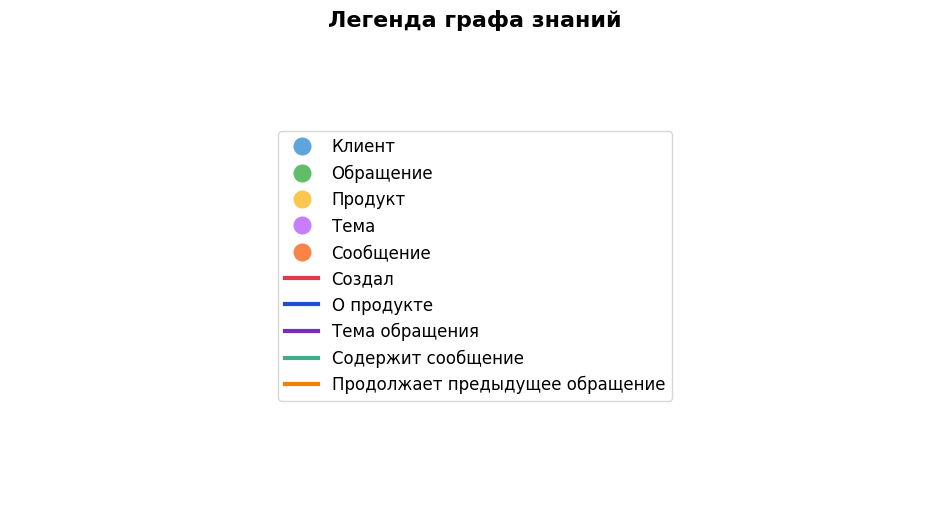

In [ ]:
# ============================================================
# ЛЕГЕНДА
# ============================================================

legend_nodes = [

    Line2D(
        [0],
        [0],
        marker='o',
        color='w',
        label='Клиент',
        markerfacecolor=NODE_COLORS["Client"],
        markersize=14
    ),

    Line2D(
        [0],
        [0],
        marker='o',
        color='w',
        label='Обращение',
        markerfacecolor=NODE_COLORS["Ticket"],
        markersize=14
    ),

    Line2D(
        [0],
        [0],
        marker='o',
        color='w',
        label='Продукт',
        markerfacecolor=NODE_COLORS["Product"],
        markersize=14
    ),

    Line2D(
        [0],
        [0],
        marker='o',
        color='w',
        label='Тема',
        markerfacecolor=NODE_COLORS["Topic"],
        markersize=14
    ),

    Line2D(
        [0],
        [0],
        marker='o',
        color='w',
        label='Сообщение',
        markerfacecolor=NODE_COLORS["Message"],
        markersize=14
    )

]

legend_edges = [

    Line2D(
        [0],
        [0],
        color=EDGE_COLORS["CREATED"],
        lw=3,
        label="Создал"
    ),

    Line2D(
        [0],
        [0],
        color=EDGE_COLORS["ABOUT"],
        lw=3,
        label="О продукте"
    ),

    Line2D(
        [0],
        [0],
        color=EDGE_COLORS["HAS_TOPIC"],
        lw=3,
        label="Тема обращения"
    ),

    Line2D(
        [0],
        [0],
        color=EDGE_COLORS["HAS_MESSAGE"],
        lw=3,
        label="Содержит сообщение"
    ),

    Line2D(
        [0],
        [0],
        color=EDGE_COLORS["FOLLOWS"],
        lw=3,
        label="Продолжает предыдущее обращение"
    )

]

plt.figure(figsize=(12,6))

plt.legend(
    handles=legend_nodes + legend_edges,
    loc="center",
    fontsize=12
)

plt.axis("off")

plt.title(
    "Легенда графа знаний",
    fontsize=16,
    fontweight="bold"
)

plt.show()

ЧАСТЬ 2. Отдельные визуализации всех связей

In [ ]:
# ============================================================
# ЧАСТЬ 2
# ВИЗУАЛИЗАЦИЯ КАЖДОГО ТИПА СВЯЗИ
# ============================================================

import networkx as nx
import matplotlib.pyplot as plt


# ------------------------------------------------------------
# Функция построения графа по одному типу связи
# ------------------------------------------------------------

def draw_relation_graph(relation,
                        title,
                        edge_color,
                        edge_label):

    H = nx.DiGraph()

    # Добавляем только нужные связи
    for u, v, d in G.edges(data=True):

        if d["rel"] == relation:

            H.add_node(u, **G.nodes[u])
            H.add_node(v, **G.nodes[v])

            H.add_edge(u, v, rel=edge_label)

    # Создаем подписи

    labels = {}

    client = 1
    ticket = 1
    message = 1

    for node, data in H.nodes(data=True):

        t = data["type"]

        if t == "Client":
            labels[node] = f"Клиент\n{client}"
            client += 1

        elif t == "Ticket":
            labels[node] = f"Обращение\n{ticket}"
            ticket += 1

        elif t == "Product":
            labels[node] = node

        elif t == "Topic":
            labels[node] = f"Тема\n{node}"

        elif t == "Message":
            labels[node] = f"Сообщение\n{message}"
            message += 1

    node_colors = [
        NODE_COLORS[H.nodes[n]["type"]]
        for n in H.nodes()
    ]

    edge_labels = {
        (u, v): edge_label
        for u, v in H.edges()
    }

    plt.figure(figsize=(16,10))

    pos = nx.spring_layout(
        H,
        seed=42,
        k=1.3
    )

    nx.draw_networkx_nodes(
        H,
        pos,
        node_color=node_colors,
        node_size=900,
        edgecolors="black"
    )

    nx.draw_networkx_edges(
        H,
        pos,
        edge_color=edge_color,
        width=2,
        arrows=True,
        arrowsize=18
    )

    nx.draw_networkx_labels(
        H,
        pos,
        labels,
        font_size=8
    )

    nx.draw_networkx_edge_labels(
        H,
        pos,
        edge_labels=edge_labels,
        font_size=8
    )

    plt.title(
        title,
        fontsize=16,
        fontweight="bold"
    )

    plt.axis("off")
    plt.show()

1. Клиент → Обращение

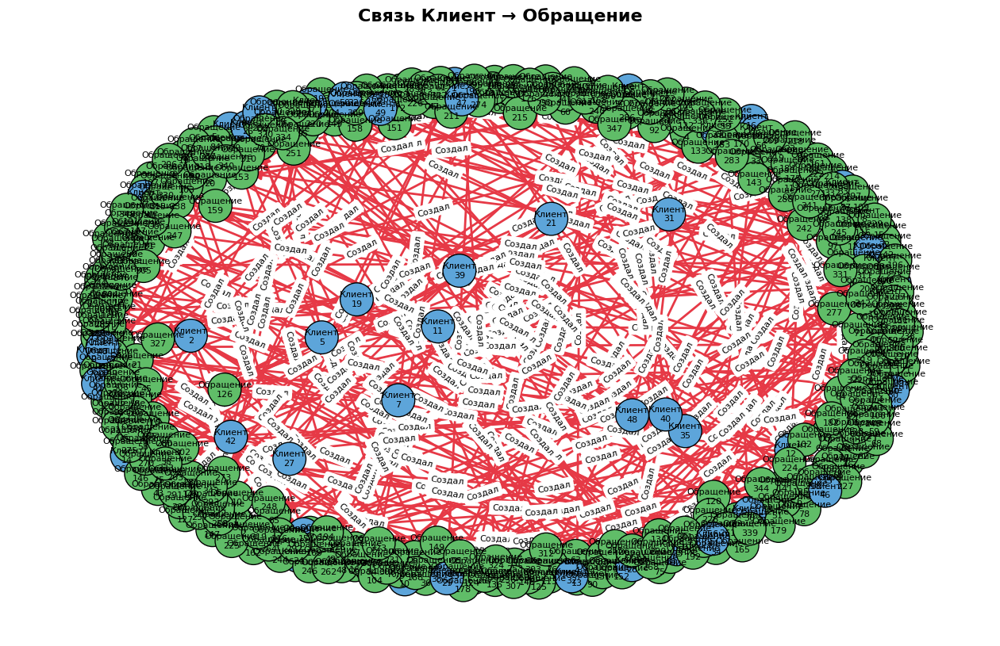

In [ ]:
draw_relation_graph(
    relation="CREATED",
    title="Связь Клиент → Обращение",
    edge_color=EDGE_COLORS["CREATED"],
    edge_label="Создал"
)

2. Обращение → Продукт

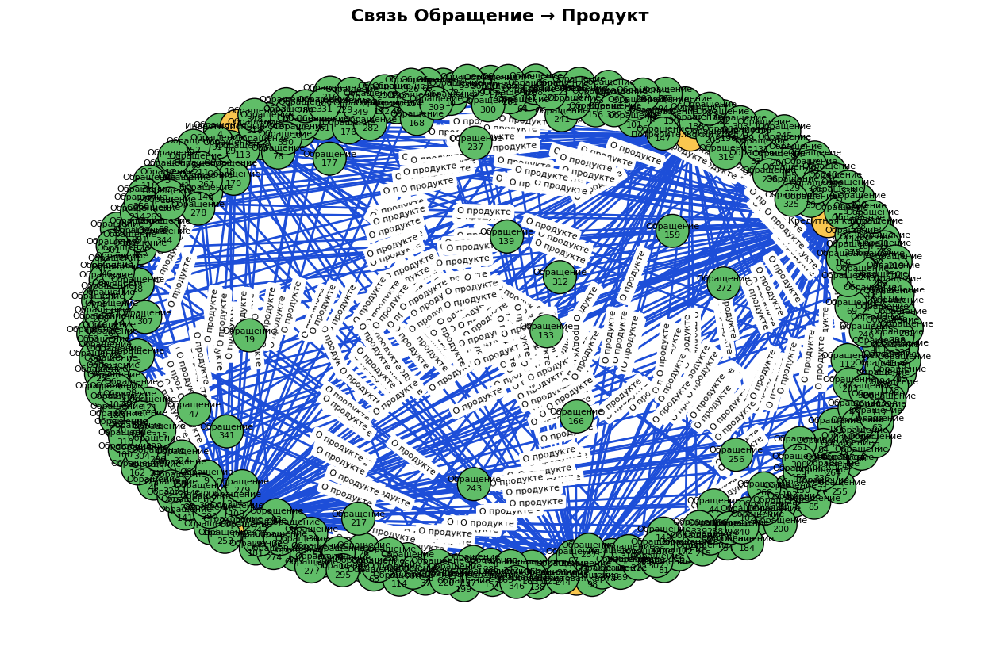

In [ ]:
draw_relation_graph(
    relation="ABOUT",
    title="Связь Обращение → Продукт",
    edge_color=EDGE_COLORS["ABOUT"],
    edge_label="О продукте"
)

3. Обращение → Тема

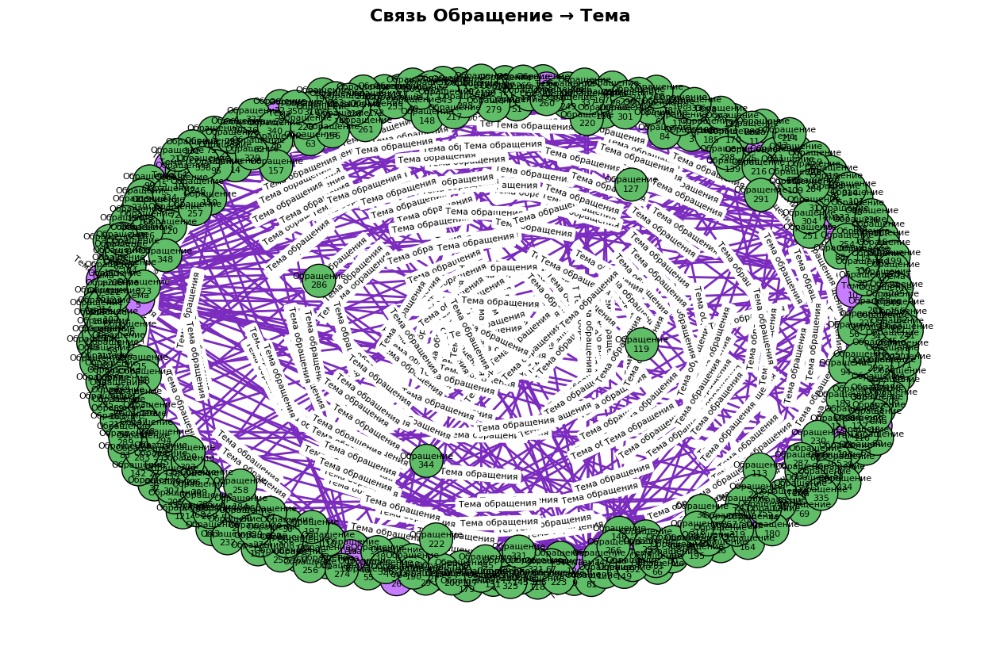

In [ ]:
draw_relation_graph(
    relation="HAS_TOPIC",
    title="Связь Обращение → Тема",
    edge_color=EDGE_COLORS["HAS_TOPIC"],
    edge_label="Тема обращения"
)

4. Обращение → Сообщение

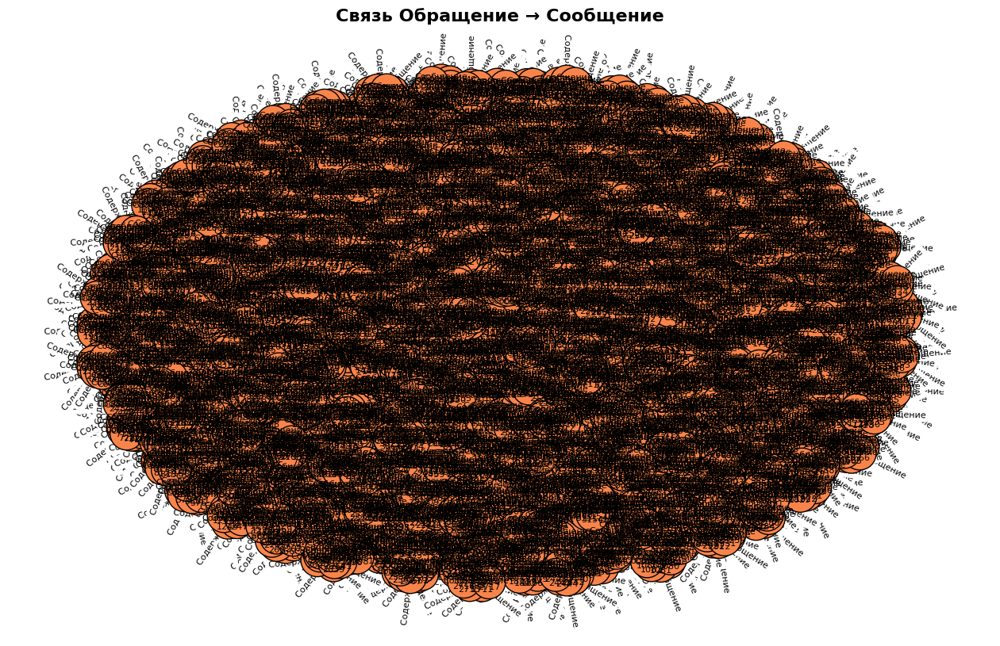

In [ ]:
draw_relation_graph(
    relation="HAS_MESSAGE",
    title="Связь Обращение → Сообщение",
    edge_color=EDGE_COLORS["HAS_MESSAGE"],
    edge_label="Содержит сообщение"
)

5. Последовательность обращений

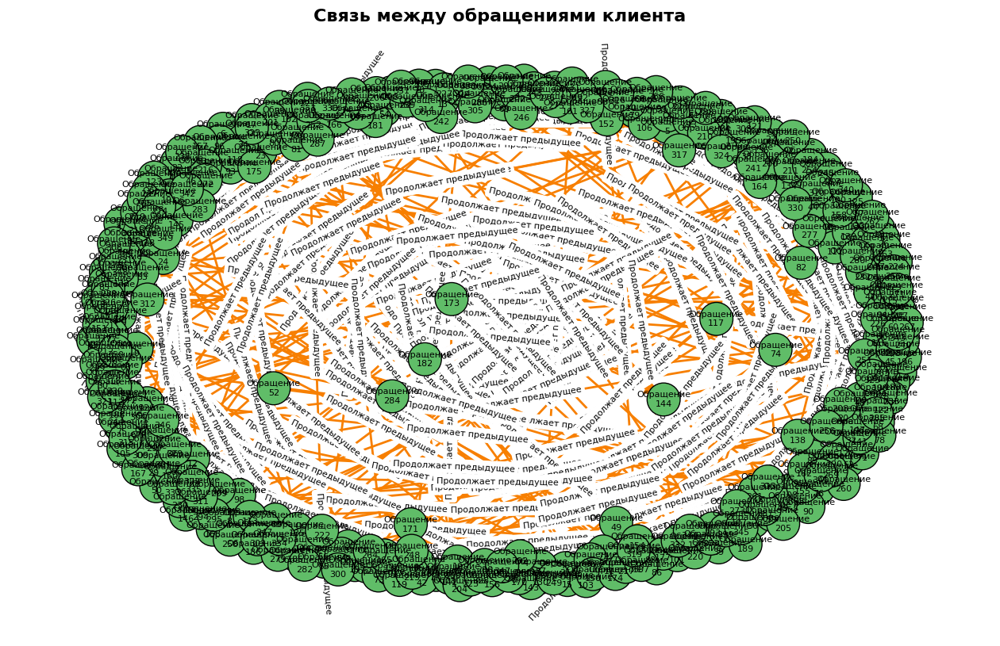

In [ ]:
draw_relation_graph(
    relation="FOLLOWS",
    title="Связь между обращениями клиента",
    edge_color=EDGE_COLORS["FOLLOWS"],
    edge_label="Продолжает предыдущее"
)

ЧАСТЬ 3. Визуализация каждого типа узлов отдельно


Универсальная функция

In [ ]:
# ============================================================
# ЧАСТЬ 3
# ВИЗУАЛИЗАЦИЯ КАЖДОГО ТИПА УЗЛОВ
# ============================================================

import matplotlib.pyplot as plt
import networkx as nx


def draw_node_type(node_type,
                   title,
                   color):

    H = nx.Graph()

    labels = {}

    counter = 1

    for node, data in G.nodes(data=True):

        if data["type"] == node_type:

            H.add_node(node)

            if node_type == "Product":

                labels[node] = node

            elif node_type == "Topic":

                labels[node] = f"Тема\n{node}"

            else:

                labels[node] = f"{NODE_LABELS[node_type]}\n{counter}"

                counter += 1

    plt.figure(figsize=(14,10))

    pos = nx.spring_layout(
        H,
        seed=42,
        k=1.5
    )

    nx.draw_networkx_nodes(
        H,
        pos,
        node_color=color,
        node_size=900,
        edgecolors="black"
    )

    nx.draw_networkx_labels(
        H,
        pos,
        labels,
        font_size=8
    )

    plt.title(
        title,
        fontsize=16,
        fontweight="bold"
    )

    plt.axis("off")
    plt.show()

Второй код:

In [ ]:
# ============================================================
# ЧАСТЬ 3
# ВИЗУАЛИЗАЦИЯ ТИПОВ УЗЛОВ
# ============================================================

import networkx as nx
import matplotlib.pyplot as plt


def draw_node_type(node_type,
                   title,
                   color):

    H = nx.Graph()

    counter = 1

    for node, data in G.nodes(data=True):

        if data["type"] == node_type:

            if node_type == "Client":
                label = f"Клиент\n{counter}"

            elif node_type == "Ticket":
                label = f"Обращение\n{counter}"

            elif node_type == "Message":
                label = f"Сообщение\n{counter}"

            elif node_type == "Topic":
                label = f"Тема\n{node}"

            elif node_type == "Product":
                label = node

            H.add_node(label)

            counter += 1

    plt.figure(figsize=(14,10))

    pos = nx.spring_layout(
        H,
        seed=42,
        k=1.5
    )

    nx.draw_networkx_nodes(
        H,
        pos,
        node_size=1200,
        node_color=color,
        edgecolors="black"
    )

    nx.draw_networkx_labels(
        H,
        pos,
        font_size=9
    )

    plt.title(
        title,
        fontsize=16,
        fontweight="bold"
    )

    plt.axis("off")
    plt.show()

1. Все клиенты

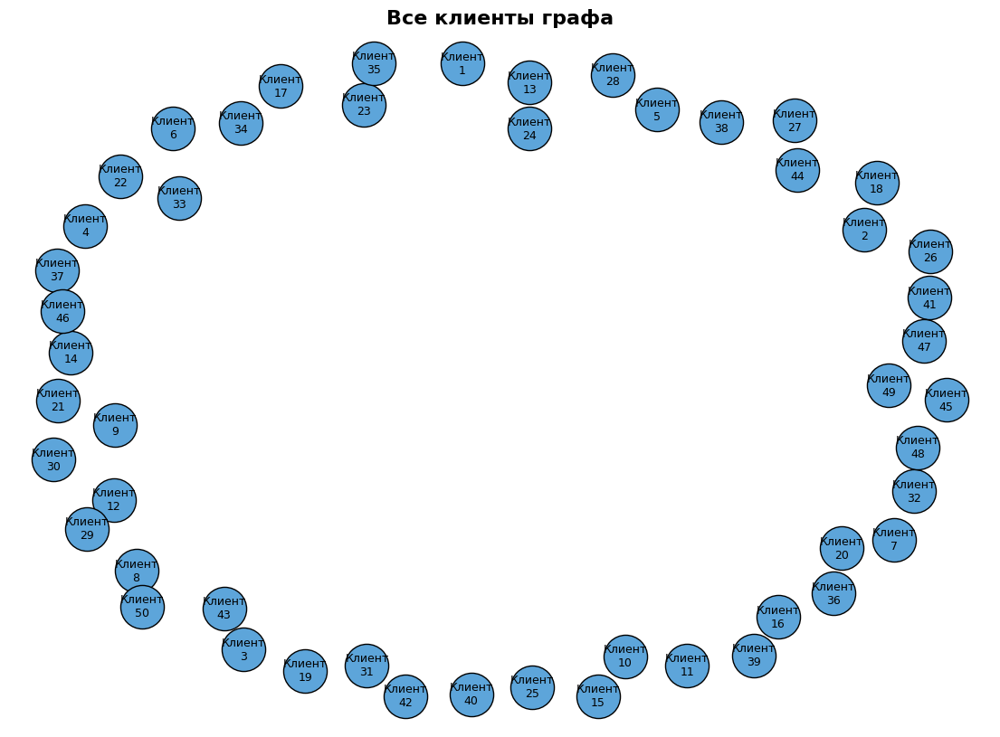

In [ ]:
draw_node_type(
    "Client",
    "Все клиенты графа",
    NODE_COLORS["Client"]
)

2. Все обращения

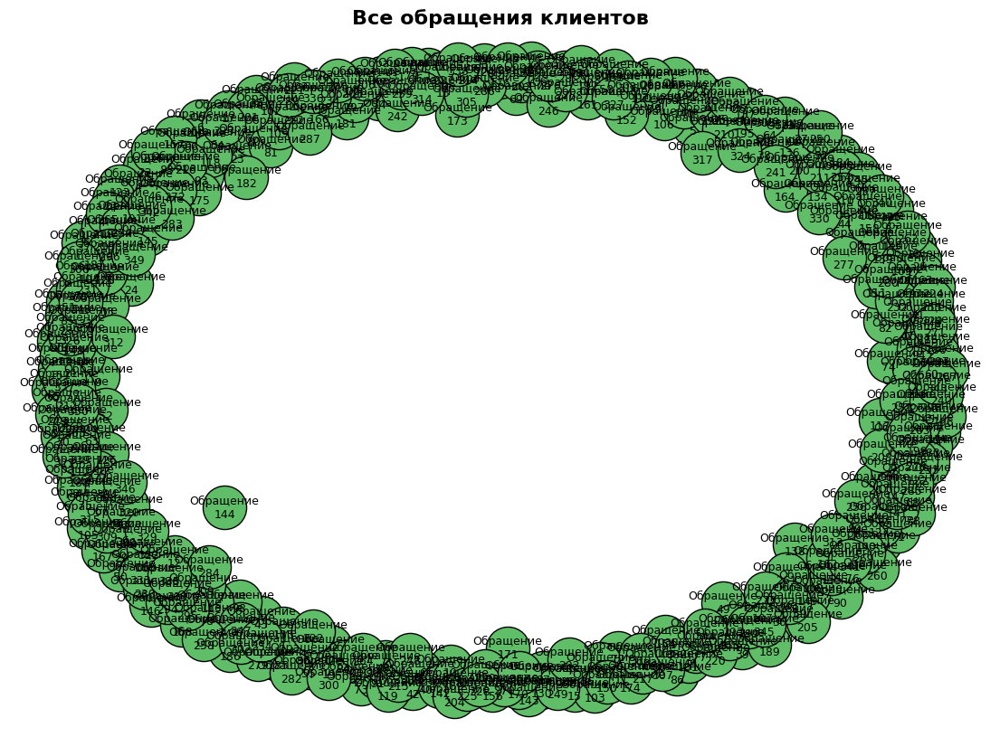

In [ ]:
draw_node_type(
    "Ticket",
    "Все обращения клиентов",
    NODE_COLORS["Ticket"]
)

3. Все продукты

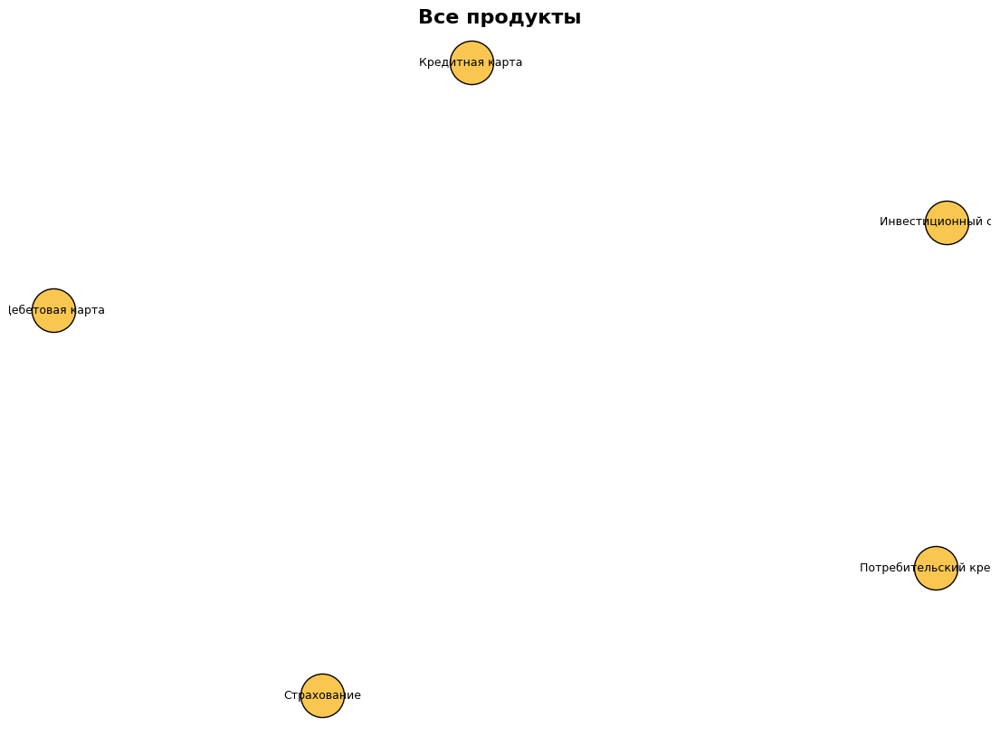

In [ ]:
draw_node_type(
    "Product",
    "Все продукты",
    NODE_COLORS["Product"]
)

4. Все темы

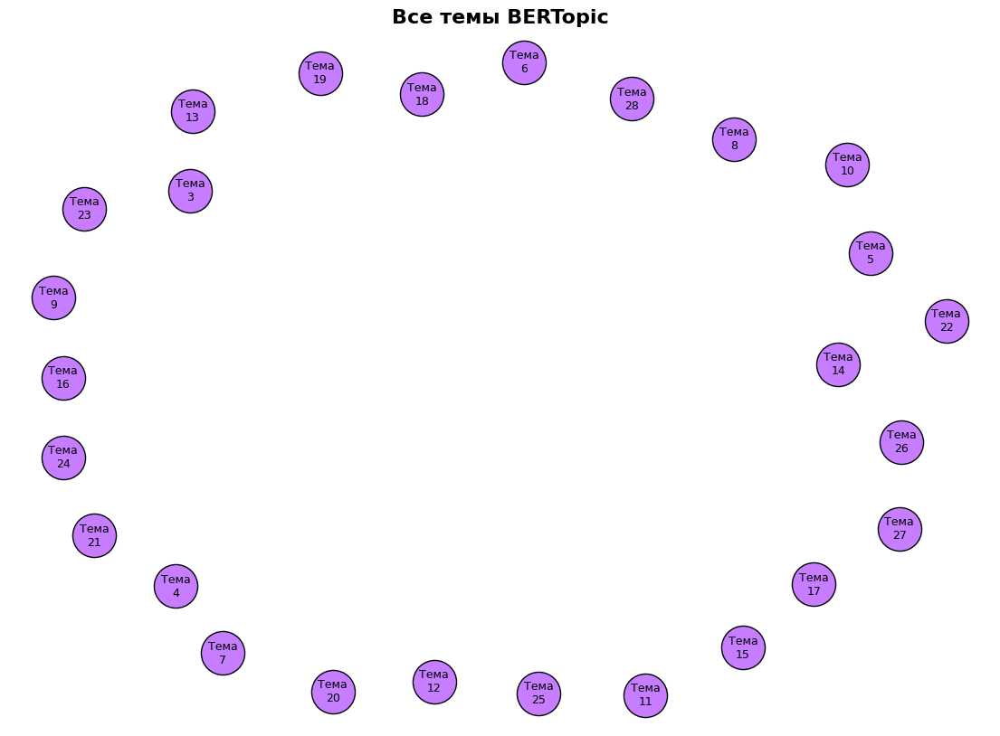

In [ ]:
draw_node_type(
    "Topic",
    "Все темы BERTopic",
    NODE_COLORS["Topic"]
)

5. Все сообщения

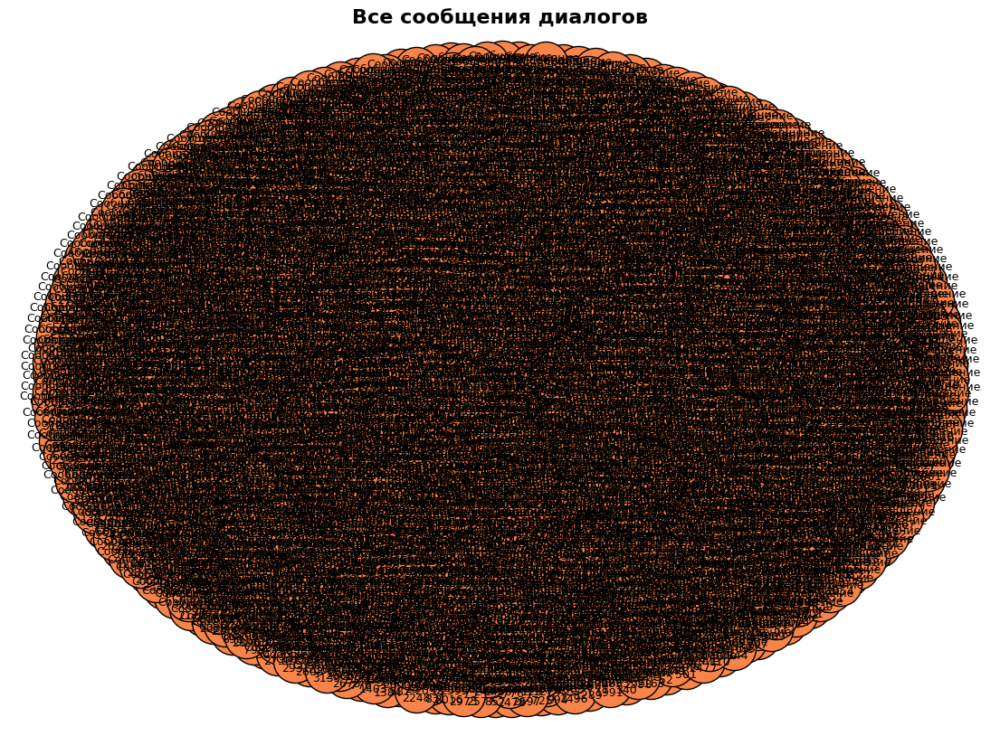

In [ ]:
draw_node_type(
    "Message",
    "Все сообщения диалогов",
    NODE_COLORS["Message"]
)

Красивая инфографика структуры графа

Это рисунок, который обычно помещают перед описанием Knowledge Graph.

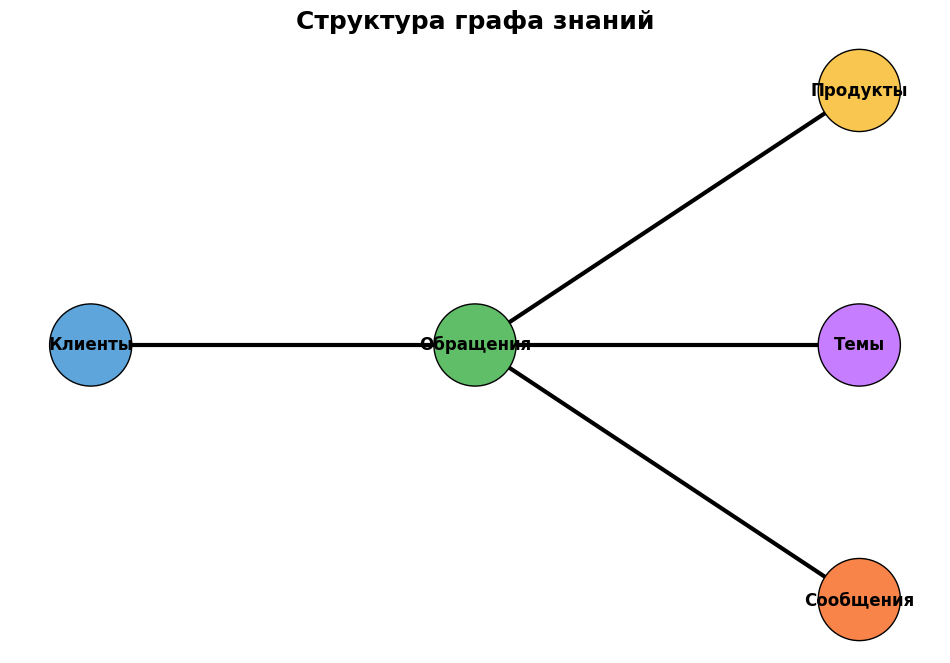

In [ ]:
# ============================================================
# СТРУКТУРА KNOWLEDGE GRAPH
# ============================================================

structure = nx.DiGraph()

structure.add_node(
    "Клиенты",
    color=NODE_COLORS["Client"]
)

structure.add_node(
    "Обращения",
    color=NODE_COLORS["Ticket"]
)

structure.add_node(
    "Продукты",
    color=NODE_COLORS["Product"]
)

structure.add_node(
    "Темы",
    color=NODE_COLORS["Topic"]
)

structure.add_node(
    "Сообщения",
    color=NODE_COLORS["Message"]
)

structure.add_edge(
    "Клиенты",
    "Обращения"
)

structure.add_edge(
    "Обращения",
    "Продукты"
)

structure.add_edge(
    "Обращения",
    "Темы"
)

structure.add_edge(
    "Обращения",
    "Сообщения"
)

plt.figure(figsize=(12,8))

pos = {

    "Клиенты":(-2,0),

    "Обращения":(0,0),

    "Продукты":(2,1),

    "Темы":(2,0),

    "Сообщения":(2,-1)

}

colors = [

    structure.nodes[n]["color"]

    for n in structure.nodes()

]

nx.draw_networkx_nodes(

    structure,

    pos,

    node_color=colors,

    node_size=3500,

    edgecolors="black"

)

nx.draw_networkx_edges(

    structure,

    pos,

    width=3,

    arrows=True,

    arrowsize=25

)

nx.draw_networkx_labels(

    structure,

    pos,

    font_size=12,

    font_weight="bold"

)

plt.title(

    "Структура графа знаний",

    fontsize=18,

    fontweight="bold"

)

plt.axis("off")

plt.show()

Дополнительная визуализация структуры Knowledge Graph

Структура модели данных

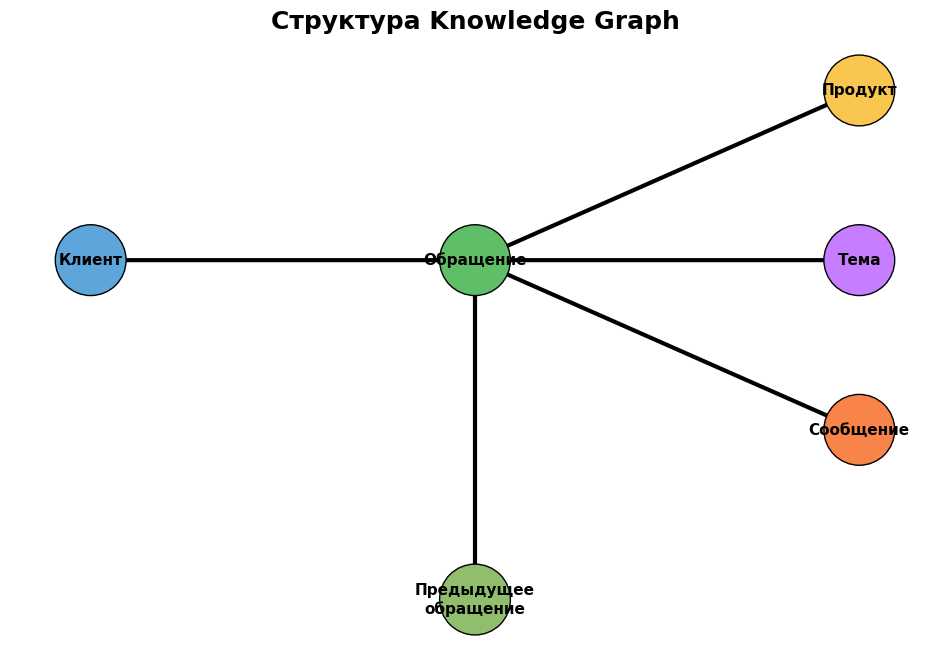

In [ ]:
# =====================================================
# СТРУКТУРА KNOWLEDGE GRAPH
# =====================================================

structure = nx.DiGraph()

structure.add_edge("Клиент","Обращение")
structure.add_edge("Обращение","Продукт")
structure.add_edge("Обращение","Тема")
structure.add_edge("Обращение","Сообщение")
structure.add_edge("Обращение","Предыдущее\nобращение")

colors = []

for n in structure.nodes():

    if n=="Клиент":
        colors.append(NODE_COLORS["Client"])

    elif n=="Обращение":
        colors.append(NODE_COLORS["Ticket"])

    elif n=="Продукт":
        colors.append(NODE_COLORS["Product"])

    elif n=="Тема":
        colors.append(NODE_COLORS["Topic"])

    elif n=="Сообщение":
        colors.append(NODE_COLORS["Message"])

    else:
        colors.append("#90BE6D")

plt.figure(figsize=(12,8))

pos = {
    "Клиент":(-1,0),
    "Обращение":(0,0),
    "Продукт":(1,1),
    "Тема":(1,0),
    "Сообщение":(1,-1),
    "Предыдущее\nобращение":(0,-2)
}

nx.draw_networkx_nodes(
    structure,
    pos,
    node_color=colors,
    node_size=2600,
    edgecolors="black"
)

nx.draw_networkx_edges(
    structure,
    pos,
    arrows=True,
    arrowsize=25,
    width=3
)

nx.draw_networkx_labels(
    structure,
    pos,
    font_size=11,
    font_weight="bold"
)

plt.title(
    "Структура Knowledge Graph",
    fontsize=18,
    fontweight="bold"
)

plt.axis("off")
plt.show()

Таблица количества объектов

In [ ]:
# ============================================================
# СТАТИСТИКА ГРАФА
# ============================================================

stats = []

for t in [
    "Client",
    "Ticket",
    "Product",
    "Topic",
    "Message"
]:

    cnt = sum(
        1
        for _, d in G.nodes(data=True)
        if d["type"] == t
    )

    stats.append([NODE_LABELS[t], cnt])

stats = pd.DataFrame(
    stats,
    columns=[
        "Тип узла",
        "Количество"
    ]
)

display(stats)

,Тип узла,Количество
0,Клиент,50
1,Обращение,350
2,Продукт,5
3,Тема,26
4,Сообщение,3176


Диаграмма количества сущностей

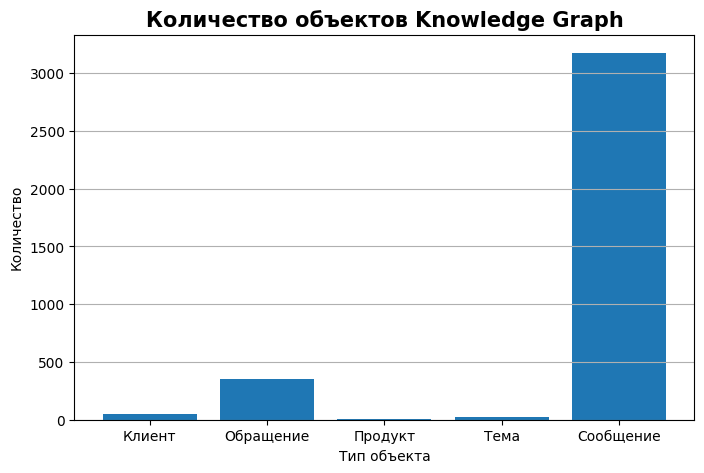

In [ ]:
plt.figure(figsize=(8,5))

plt.bar(

    stats["Тип узла"],

    stats["Количество"]

)

plt.title(

    "Количество объектов Knowledge Graph",

    fontsize=15,

    fontweight="bold"

)

plt.xlabel("Тип объекта")

plt.ylabel("Количество")

plt.grid(axis="y")

plt.show()

ЧАСТЬ 4
Аналитика Knowledge Graph

1. Папка для всех рисунков

In [ ]:
# ============================================================
# СОХРАНЕНИЕ ВСЕХ РИСУНКОВ
# ============================================================

import os

SAVE_DIR = "Knowledge_Graph_Figures"

os.makedirs(SAVE_DIR, exist_ok=True)

print("Папка создана:", SAVE_DIR)

Папка создана: Knowledge_Graph_Figures


2. Статистика графа

In [ ]:
# ============================================================
# ОБЩАЯ СТАТИСТИКА KNOWLEDGE GRAPH
# ============================================================

print("="*60)
print("СТАТИСТИКА KNOWLEDGE GRAPH")
print("="*60)

print(f"Количество узлов: {G.number_of_nodes()}")
print(f"Количество связей: {G.number_of_edges()}")

print()

types = {}

for _, data in G.nodes(data=True):

    t = data["type"]

    types[t] = types.get(t,0)+1

print("Типы узлов:\n")

for k,v in types.items():
    print(f"{k:15} : {v}")

print()

rels = {}

for _,_,d in G.edges(data=True):

    r = d["rel"]

    rels[r] = rels.get(r,0)+1

print("Типы связей:\n")

for k,v in rels.items():
    print(f"{k:15} : {v}")

СТАТИСТИКА KNOWLEDGE GRAPH
Количество узлов: 3607
Количество связей: 4526

Типы узлов:

Client          : 50
Ticket          : 350
Product         : 5
Topic           : 26
Message         : 3176

Типы связей:

CREATED         : 350
ABOUT           : 350
HAS_TOPIC       : 350
FOLLOWS         : 300
HAS_MESSAGE     : 3176


3. Диаграмма количества узлов

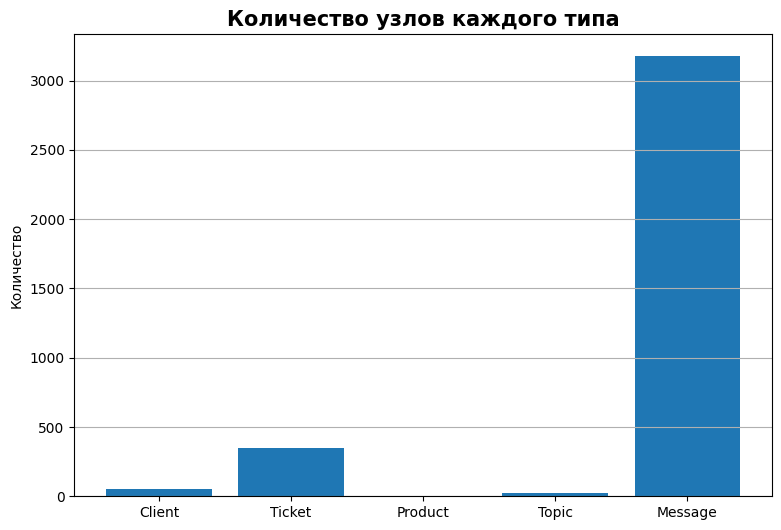

In [ ]:
# ============================================================
# РАСПРЕДЕЛЕНИЕ ТИПОВ УЗЛОВ
# ============================================================

plt.figure(figsize=(9,6))

plt.bar(
    types.keys(),
    types.values()
)

plt.title(
    "Количество узлов каждого типа",
    fontsize=15,
    fontweight="bold"
)

plt.ylabel("Количество")

plt.grid(axis="y")

plt.savefig(
    os.path.join(
        SAVE_DIR,
        "NodeTypes.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

4. Диаграмма количества связей

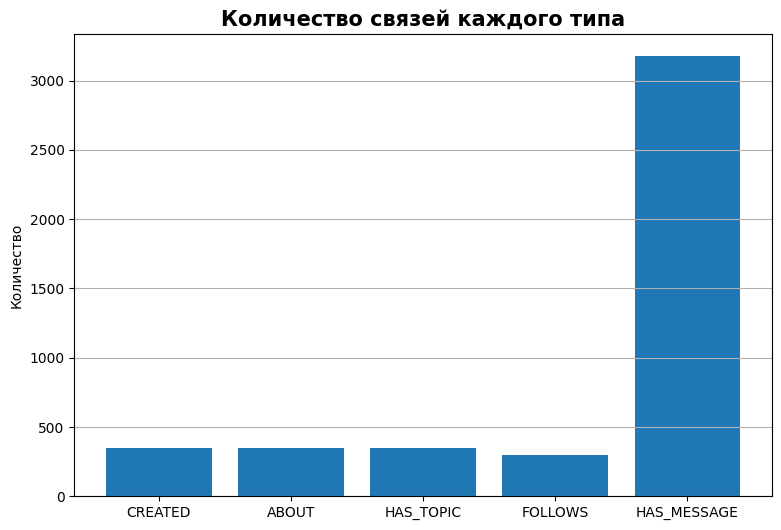

In [ ]:
# ============================================================
# РАСПРЕДЕЛЕНИЕ СВЯЗЕЙ
# ============================================================

plt.figure(figsize=(9,6))

plt.bar(
    rels.keys(),
    rels.values()
)

plt.title(
    "Количество связей каждого типа",
    fontsize=15,
    fontweight="bold"
)

plt.ylabel("Количество")

plt.grid(axis="y")

plt.savefig(
    os.path.join(
        SAVE_DIR,
        "EdgeTypes.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

5. Степень вершин

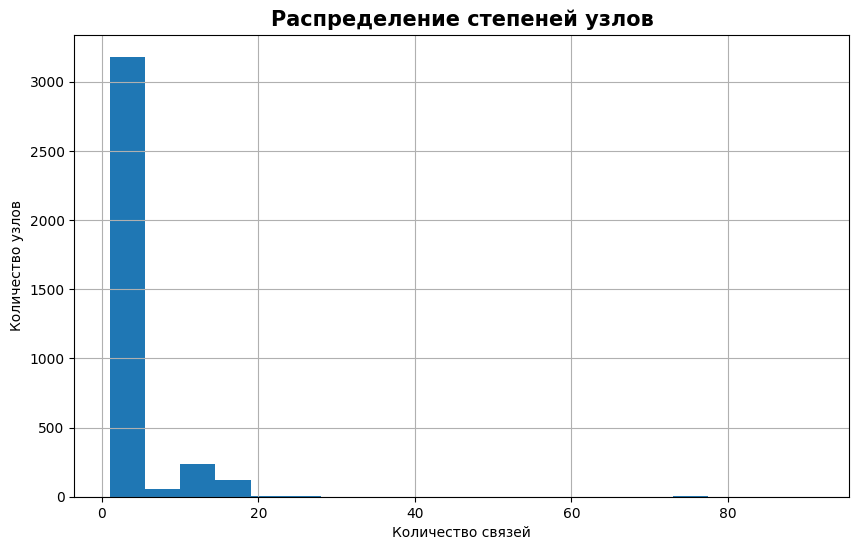

In [ ]:
# ============================================================
# РАСПРЕДЕЛЕНИЕ СТЕПЕНЕЙ УЗЛОВ
# ============================================================

degrees = [d for _,d in G.degree()]

plt.figure(figsize=(10,6))

plt.hist(
    degrees,
    bins=20
)

plt.title(
    "Распределение степеней узлов",
    fontsize=15,
    fontweight="bold"
)

plt.xlabel("Количество связей")

plt.ylabel("Количество узлов")

plt.grid()

plt.savefig(
    os.path.join(
        SAVE_DIR,
        "DegreeDistribution.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

6. Топ-15 самых связанных узлов

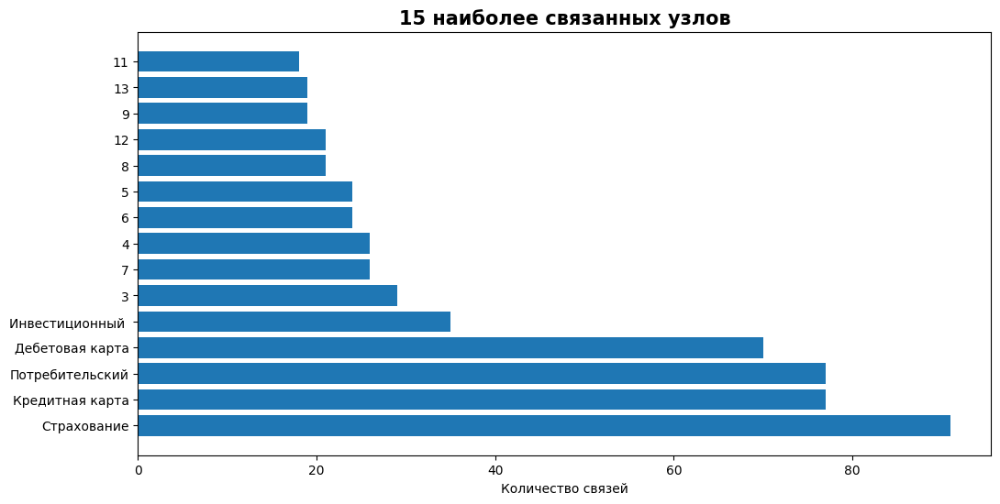

In [ ]:
# ============================================================
# САМЫЕ СВЯЗАННЫЕ УЗЛЫ
# ============================================================

deg = dict(G.degree())

top = sorted(
    deg.items(),
    key=lambda x:x[1],
    reverse=True
)[:15]

labels = [str(i[0])[:15] for i in top]
values = [i[1] for i in top]

plt.figure(figsize=(12,6))

plt.barh(
    labels,
    values
)

plt.title(
    "15 наиболее связанных узлов",
    fontsize=15,
    fontweight="bold"
)

plt.xlabel("Количество связей")

plt.savefig(
    os.path.join(
        SAVE_DIR,
        "TopNodes.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

7. Центральность узлов

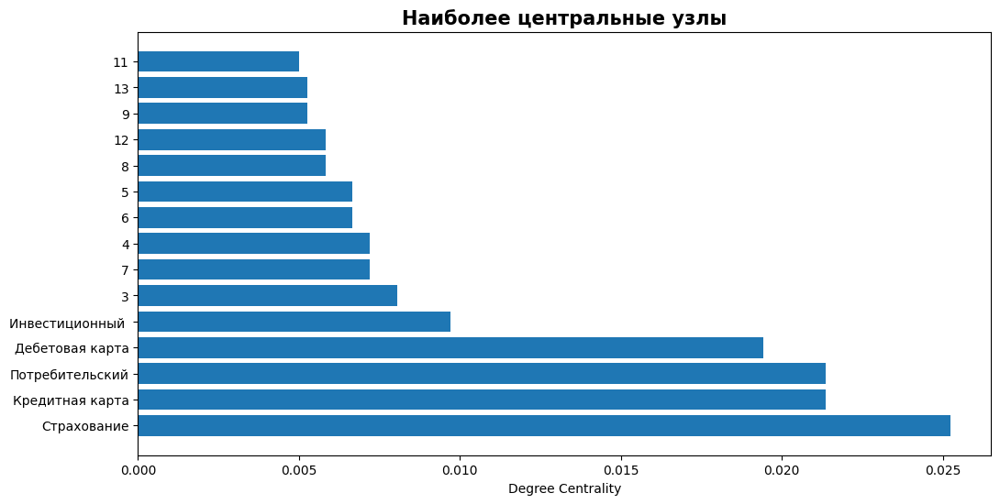

In [ ]:
# ============================================================
# ЦЕНТРАЛЬНОСТЬ УЗЛОВ
# ============================================================

centrality = nx.degree_centrality(G)

top = sorted(
    centrality.items(),
    key=lambda x:x[1],
    reverse=True
)[:15]

labels = [str(i[0])[:15] for i in top]
values = [i[1] for i in top]

plt.figure(figsize=(12,6))

plt.barh(
    labels,
    values
)

plt.title(
    "Наиболее центральные узлы",
    fontsize=15,
    fontweight="bold"
)

plt.xlabel("Degree Centrality")

plt.savefig(
    os.path.join(
        SAVE_DIR,
        "Centrality.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

8. Автоматическое сохранение текущей фигуры

In [ ]:
plt.savefig(
    os.path.join(
        SAVE_DIR,
        "FullKnowledgeGraph.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.savefig(
    os.path.join(
        SAVE_DIR,
        "ClientTicket.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.savefig(
    os.path.join(
        SAVE_DIR,
        "TicketProduct.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.savefig(
    os.path.join(
        SAVE_DIR,
        "TicketTopic.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.savefig(
    os.path.join(
        SAVE_DIR,
        "TicketMessage.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.savefig(
    os.path.join(
        SAVE_DIR,
        "TicketFollows.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.savefig(
    os.path.join(
        SAVE_DIR,
        "Clients.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.savefig(
    os.path.join(
        SAVE_DIR,
        "Tickets.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.savefig(
    os.path.join(
        SAVE_DIR,
        "Products.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.savefig(
    os.path.join(
        SAVE_DIR,
        "Topics.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.savefig(
    os.path.join(
        SAVE_DIR,
        "Messages.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.savefig(
    os.path.join(
        SAVE_DIR,
        "Legend.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.savefig(
    os.path.join(
        SAVE_DIR,
        "Structure.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

<Figure size 640x480 with 0 Axes>

1. Полный интерактивный Knowledge Graph

In [ ]:
import networkx as nx
import plotly.graph_objects as go

###############################################################
# LAYOUT
###############################################################

# Если граф очень большой, лучше взять подграф
MAX_NODES = 300

if G.number_of_nodes() > MAX_NODES:

    nodes = list(G.nodes())[:MAX_NODES]
    H = G.subgraph(nodes).copy()

else:
    H = G.copy()

###############################################################
# POSITIONS
###############################################################

pos = nx.spring_layout(
    H,
    seed=42,
    k=0.4
)

###############################################################
# NODE COLORS
###############################################################

node_colors = {
    "Customer":"#1f77b4",
    "Ticket":"#ff7f0e",
    "Message":"#2ca02c",
    "Product":"#d62728",
    "State":"#9467bd",
    "Entity":"#8c564b",
    "Emotion":"#e377c2",
    "City":"#7f7f7f",
    "Segment":"#bcbd22",
    "Topic":"#17becf",
    "Unknown":"lightgray"
}

###############################################################
# EDGE TRACE
###############################################################

edge_x = []
edge_y = []

for u,v in H.edges():

    x0,y0 = pos[u]
    x1,y1 = pos[v]

    edge_x += [x0,x1,None]
    edge_y += [y0,y1,None]

edge_trace = go.Scatter(

    x=edge_x,
    y=edge_y,

    mode="lines",

    line=dict(
        width=0.7,
        color="gray"
    ),

    hoverinfo="none"
)

###############################################################
# NODE TRACE
###############################################################

node_x=[]
node_y=[]

node_text=[]
node_color=[]

for node,data in H.nodes(data=True):

    x,y=pos[node]

    node_x.append(x)
    node_y.append(y)

    node_type=data.get("type","Unknown")

    node_color.append(
        node_colors.get(node_type,"lightgray")
    )

    node_text.append(
        f"""
<b>{node}</b>

Type:
{node_type}

Degree:
{H.degree(node)}
"""
    )

node_trace = go.Scatter(

    x=node_x,
    y=node_y,

    mode="markers+text",

    text=[
        str(n) if H.degree(n)>4 else ""
        for n in H.nodes()
    ],

    textposition="top center",

    hovertext=node_text,

    hoverinfo="text",

    marker=dict(

        size=12,

        color=node_color,

        line=dict(
            width=1,
            color="black"
        )

    )

)

###############################################################
# FIGURE
###############################################################

fig = go.Figure(

    data=[edge_trace,node_trace]

)

fig.update_layout(

    title="Interactive Customer Knowledge Graph",

    width=1500,
    height=900,

    hovermode="closest",

    showlegend=False,

    plot_bgcolor="white",

    xaxis=dict(
        visible=False
    ),

    yaxis=dict(
        visible=False
    )

)

fig.show()

In [ ]:
###############################################################
# ИНТЕРАКТИВНЫЙ KNOWLEDGE GRAPH НА РУССКОМ
# Plotly + NetworkX
###############################################################

import networkx as nx
import plotly.graph_objects as go


###############################################################
# НАСТРОЙКИ
###############################################################

MAX_NODES = 400


###############################################################
# ПЕРЕВОДЫ
###############################################################

NODE_NAMES = {

    "Customer": "Клиент",
    "Ticket": "Обращение",
    "Message": "Сообщение",
    "Product": "Продукт",
    "State": "Этап жизненного цикла",
    "Entity": "Сущность NLP",
    "Emotion": "Эмоция",
    "City": "Город",
    "Segment": "Сегмент клиента",
    "Topic": "Тема",
    "Unknown": "Неизвестно"

}


EDGE_NAMES = {

    "CREATED": "создал обращение",

    "HAS_MESSAGE": "содержит сообщение",

    "ABOUT_PRODUCT": "относится к продукту",

    "HAS_STATE": "имеет состояние",

    "STATE_TRANSITION": "переход состояния",

    "NEXT_TICKET": "следующее обращение",

    "MENTIONS": "упоминает сущность",

    "OWNS_PRODUCT": "использует продукт",

    "LIVES_IN": "проживает в городе",

    "BELONGS_TO": "принадлежит сегменту",

    "HAS_TOPIC": "имеет тему",

    "HAS_EMOTION": "имеет эмоцию"

}



###############################################################
# ЦВЕТА УЗЛОВ
###############################################################

NODE_COLORS = {

    "Customer": "#3498db",

    "Ticket": "#e67e22",

    "Message": "#2ecc71",

    "Product": "#e74c3c",

    "State": "#9b59b6",

    "Entity": "#795548",

    "Emotion": "#e91e63",

    "City": "#607d8b",

    "Segment": "#cddc39",

    "Topic": "#00bcd4",

    "Unknown": "#95a5a6"

}



###############################################################
# ЦВЕТА СВЯЗЕЙ
###############################################################

EDGE_COLORS = {

    "CREATED":"#3498db",

    "HAS_MESSAGE":"#2ecc71",

    "ABOUT_PRODUCT":"#e74c3c",

    "HAS_STATE":"#9b59b6",

    "STATE_TRANSITION":"#f39c12",

    "NEXT_TICKET":"#34495e",

    "MENTIONS":"#795548",

    "OWNS_PRODUCT":"#00bcd4",

    "LIVES_IN":"#607d8b",

    "BELONGS_TO":"#cddc39",

    "HAS_TOPIC":"#e91e63",

    "HAS_EMOTION":"#ff9800"

}



###############################################################
# СОЗДАЕМ КОПИЮ ГРАФА
###############################################################

if G.number_of_nodes() > MAX_NODES:

    print(
        f"Граф содержит {G.number_of_nodes()} узлов."
    )

    print(
        f"Используется подграф первых {MAX_NODES} узлов."
    )

    nodes = list(G.nodes())[:MAX_NODES]

    H = G.subgraph(nodes).copy()

else:

    H = G.copy()



###############################################################
# РАСКЛАДКА
###############################################################

pos = nx.spring_layout(
    H,
    seed=42,
    k=0.5
)



###############################################################
# РЕБРА
###############################################################

edge_x = []
edge_y = []

edge_hover = []


for u,v,data in H.edges(data=True):

    x0,y0 = pos[u]

    x1,y1 = pos[v]


    edge_x.extend(
        [
            x0,
            x1,
            None
        ]
    )


    edge_y.extend(
        [
            y0,
            y1,
            None
        ]
    )


    relation = data.get(
        "rel",
        "RELATED"
    )


    edge_hover.append(

        EDGE_NAMES.get(
            relation,
            relation
        )

    )



edge_trace = go.Scatter(

    x=edge_x,

    y=edge_y,

    mode="lines",

    line=dict(

        width=1,

        color="#999999"

    ),

    hoverinfo="none"

)



###############################################################
# УЗЛЫ
###############################################################

node_x=[]
node_y=[]

node_text=[]
node_color=[]

node_labels=[]


for node,data in H.nodes(data=True):


    x,y = pos[node]


    node_x.append(x)

    node_y.append(y)



    node_type = data.get(

        "type",

        "Unknown"

    )


    node_color.append(

        NODE_COLORS.get(

            node_type,

            "#95a5a6"

        )

    )



    node_text.append(

f"""
<b>{node}</b>

Тип:
{NODE_NAMES.get(node_type,node_type)}

Связей:
{H.degree(node)}

"""

    )



    # подписи только важных узлов

    if H.degree(node) >= 3:

        node_labels.append(

            str(node)[:20]

        )

    else:

        node_labels.append("")





node_trace = go.Scatter(

    x=node_x,

    y=node_y,

    mode="markers+text",

    text=node_labels,

    textposition="top center",


    hovertext=node_text,

    hoverinfo="text",


    marker=dict(

        size=18,

        color=node_color,

        line=dict(

            width=1,

            color="black"

        )

    )

)



###############################################################
# СОЗДАНИЕ ГРАФИКА
###############################################################

fig = go.Figure(

    data=[

        edge_trace,

        node_trace

    ]

)



fig.update_layout(


    title={

        "text":
        "🧠 Интерактивный граф знаний клиентского жизненного цикла",

        "x":0.5

    },


    width=1600,

    height=1000,


    hovermode="closest",


    plot_bgcolor="white",


    xaxis=dict(

        visible=False

    ),


    yaxis=dict(

        visible=False

    )


)



###############################################################
# ЛЕГЕНДА
###############################################################

legend_text = """

<b>ЛЕГЕНДА</b><br><br>

🔵 Клиент<br>

🟠 Обращение<br>

🟢 Сообщение<br>

🔴 Продукт<br>

🟣 Этап жизненного цикла<br>

🟤 NLP сущность<br>

🌸 Эмоция<br>

⚫ Город<br>

🟡 Сегмент<br>

🔵 Тема

"""


fig.add_annotation(

    x=1.05,

    y=0.5,

    xref="paper",

    yref="paper",

    text=legend_text,

    showarrow=False,

    font=dict(size=14)

)



###############################################################
# ПОКАЗ
###############################################################

fig.show()



###############################################################
# СОХРАНЕНИЕ HTML
###############################################################

fig.write_html(

    "customer_knowledge_graph_ru.html"

)


print(
    "Готово!"
)

print(
    "Файл сохранен: customer_knowledge_graph_ru.html"
)

Граф содержит 3607 узлов.
Используется подграф первых 400 узлов.


Готово!
Файл сохранен: customer_knowledge_graph_ru.html
